Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

Importing Dataset

In [2]:
base_credit = pd.read_csv('credit_risk_dataset (1).csv')

In [3]:
base_credit

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


In [4]:
base_credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [5]:
base_credit.isnull().sum()

person_age                       0
person_income                    0
person_home_ownership            0
person_emp_length              895
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_int_rate                 3116
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
dtype: int64

In [6]:
base_credit = base_credit.dropna()

In [7]:
base_credit.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28638 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  28638 non-null  int64  
 1   person_income               28638 non-null  int64  
 2   person_home_ownership       28638 non-null  object 
 3   person_emp_length           28638 non-null  float64
 4   loan_intent                 28638 non-null  object 
 5   loan_grade                  28638 non-null  object 
 6   loan_amnt                   28638 non-null  int64  
 7   loan_int_rate               28638 non-null  float64
 8   loan_status                 28638 non-null  int64  
 9   loan_percent_income         28638 non-null  float64
 10  cb_person_default_on_file   28638 non-null  object 
 11  cb_person_cred_hist_length  28638 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 2.8+ MB


Performing EDA

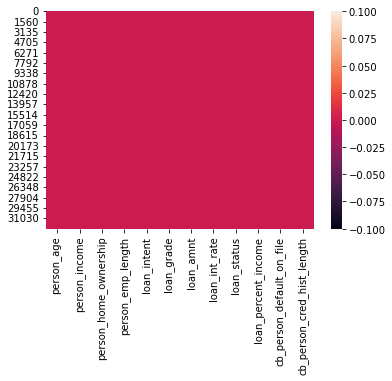

In [8]:
sns.heatmap(base_credit.isnull());

In [9]:
temp = base_credit.describe()
temp.style.background_gradient(cmap='Oranges')

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000
mean,27.727216,66649.371884,4.788672,9656.493121,11.039867,0.216600,0.169488,5.793736
std,6.310441,62356.447405,4.154627,6329.683361,3.229372,0.411935,0.106393,4.038483
min,20.000000,4000.000000,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,39480.000000,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,55956.000000,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,80000.000000,7.000000,12500.000000,13.480000,0.000000,0.230000,8.000000
max,144.000000,6000000.000000,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


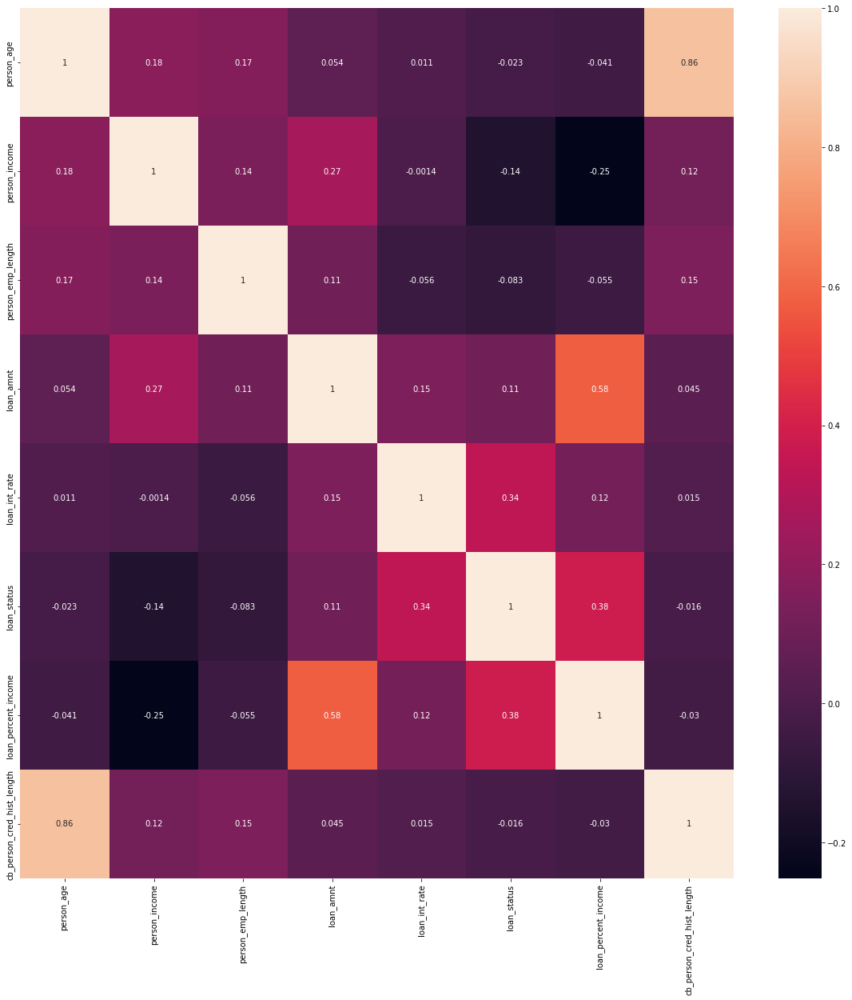

In [10]:
correlations = base_credit.corr()
f, ax = plt.subplots(figsize = (20,20))
sns.heatmap(correlations, annot=True)
correlations.round(2);

In [11]:
base_credit = base_credit[base_credit['person_age'] <= 84]

In [12]:
base_credit['person_age'].max()

84

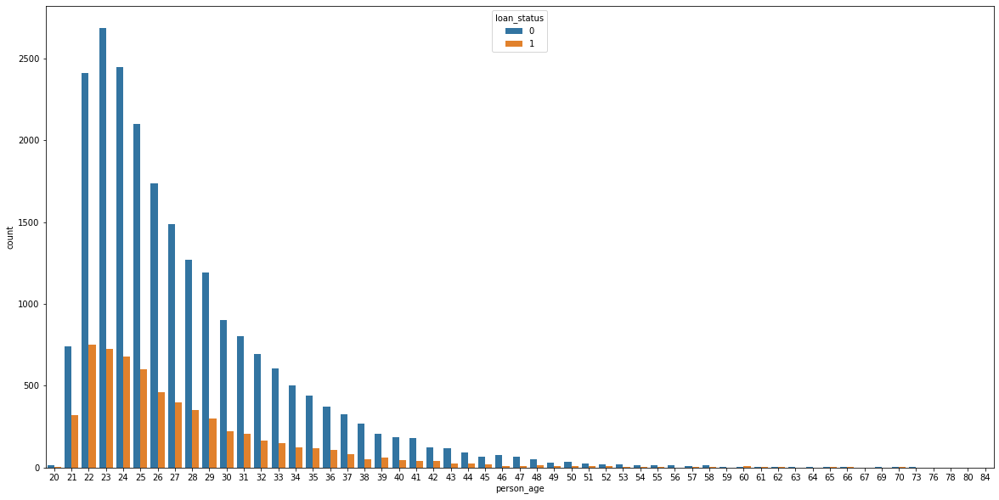

In [13]:
plt.figure(figsize=[20,10])
sns.countplot(x = 'person_age', hue= 'loan_status', data=base_credit);

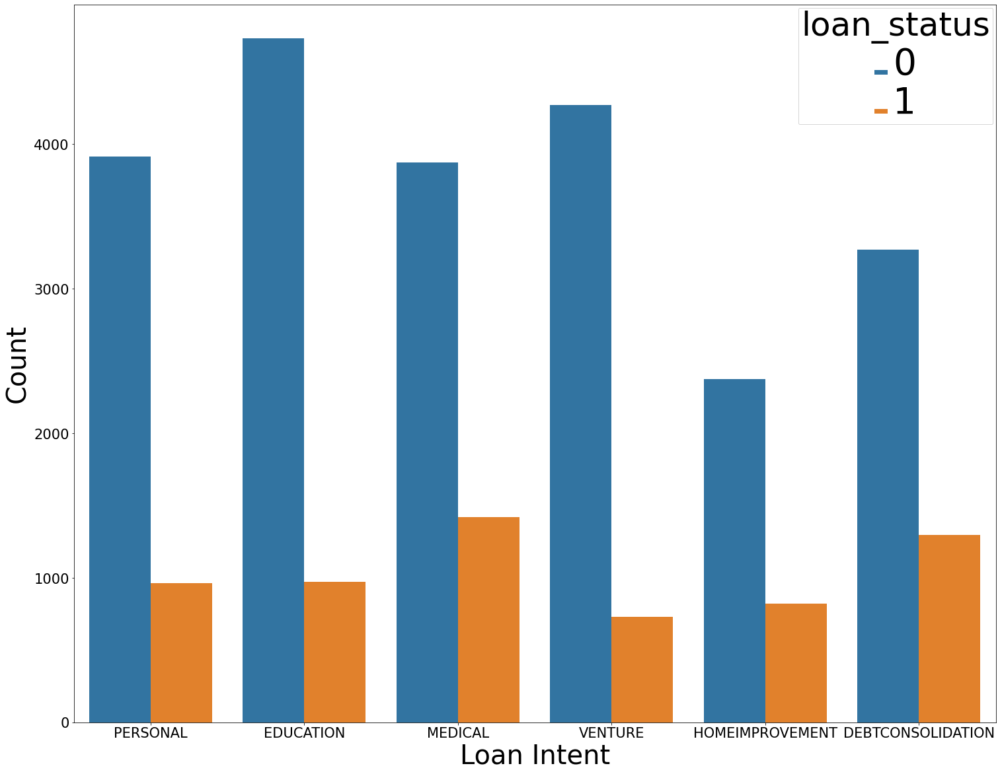

In [14]:
plt.figure(figsize=[25,20])
a1 = sns.countplot(x = 'loan_intent', hue= 'loan_status', data=base_credit)
for label in (a1.get_xticklabels() + a1.get_yticklabels()):
	label.set_fontsize(21)
plt.xlabel("Loan Intent", fontsize = 40)
plt.ylabel("Count", fontsize = 40)
plt.setp(a1.get_legend().get_texts(), fontsize='55')
plt.setp(a1.get_legend().get_title(), fontsize='50')

plt.show();

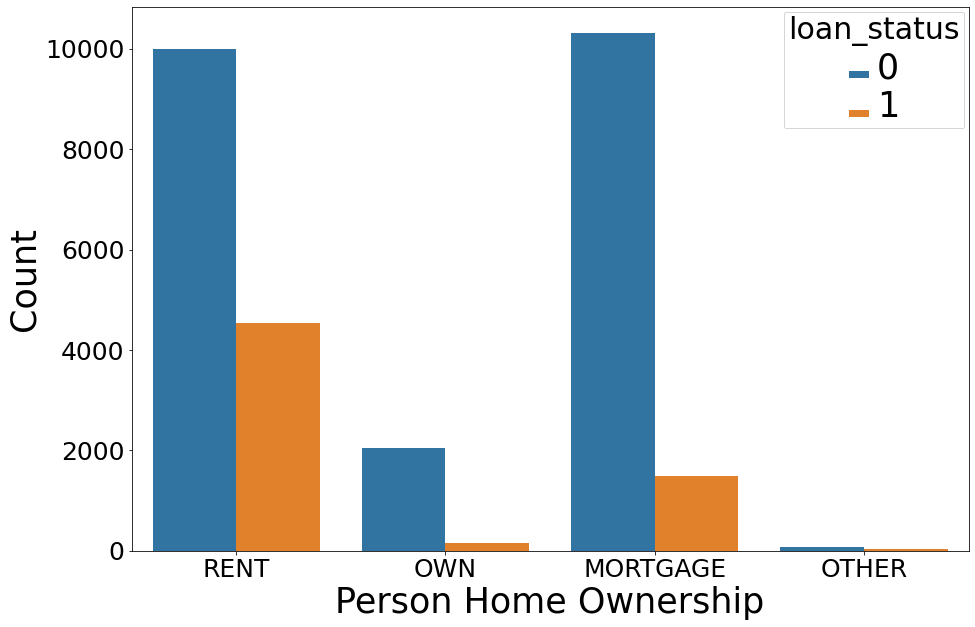

In [15]:
plt.figure(figsize=[15,10])
a2 = sns.countplot(x = 'person_home_ownership', hue= 'loan_status', data=base_credit)
for label in (a2.get_xticklabels() + a2.get_yticklabels()):
	label.set_fontsize(25)
plt.xlabel("Person Home Ownership", fontsize = 35)
plt.ylabel("Count", fontsize = 35)
plt.setp(a2.get_legend().get_texts(), fontsize='35')
plt.setp(a2.get_legend().get_title(), fontsize='30')

plt.show();

Classifing the dataset

In [16]:
debtor = base_credit[base_credit['loan_status'] == 1]
no_debtor = base_credit[base_credit['loan_status'] == 0]

In [17]:
fig1 = px.histogram(debtor,x='loan_intent',color='loan_intent',template='plotly_dark')
fig1.show()

In [18]:
fig1 = px.histogram(no_debtor,x='loan_intent',color='loan_intent',template='plotly_dark')
fig1.show()

In [19]:
fig1 = px.histogram(debtor,x='person_home_ownership',color='person_home_ownership',template='plotly_dark')
fig1.show()

In [20]:
fig1 = px.histogram(no_debtor,x='person_home_ownership',color='person_home_ownership',template='plotly_dark')
fig1.show()

In [21]:
fig1 = px.histogram(debtor,x='person_age',color='person_age',template='plotly_dark')
fig1.show()

In [22]:
grafico = px.scatter_matrix(base_credit, dimensions=['person_age', 'person_income', 'loan_amnt'], color = 'loan_status')
grafico.show()

In [23]:
grafico = px.treemap(base_credit, path=['person_age','person_income', 'loan_amnt'])
grafico.show()

Creating dependent and independent variables

In [24]:
X_credit = base_credit.drop(columns=['loan_status'])
X_credit

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0.10,N,26


In [25]:
X_credit.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length'],
      dtype='object')

In [26]:
X_credit = X_credit.values

In [27]:
type(X_credit)

numpy.ndarray

In [28]:
X_credit

array([[22, 59000, 'RENT', ..., 0.59, 'Y', 3],
       [21, 9600, 'OWN', ..., 0.1, 'N', 2],
       [25, 9600, 'MORTGAGE', ..., 0.57, 'N', 3],
       ...,
       [65, 76000, 'RENT', ..., 0.46, 'N', 28],
       [56, 150000, 'MORTGAGE', ..., 0.1, 'N', 26],
       [66, 42000, 'RENT', ..., 0.15, 'N', 30]], dtype=object)

In [29]:
y_credit = base_credit.iloc[:, 8].values

In [30]:
y_credit

array([1, 0, 1, ..., 1, 0, 0], dtype=int64)

Label encoding

In [31]:
from sklearn.preprocessing import LabelEncoder
label_encoder_teste = LabelEncoder()

In [32]:
X_credit[0]

array([22, 59000, 'RENT', 123.0, 'PERSONAL', 'D', 35000, 16.02, 0.59, 'Y',
       3], dtype=object)

In [33]:
label_encoder_person_home_ownership = LabelEncoder()
label_encoder_loan_intent = LabelEncoder()
label_encoder_loan_grade = LabelEncoder()
label_encoder_cb_person_default_on_file = LabelEncoder()

In [34]:
X_credit[:,2] = label_encoder_person_home_ownership.fit_transform(X_credit[:,2])
X_credit[:,4] = label_encoder_loan_intent.fit_transform(X_credit[:,2])
X_credit[:,5] = label_encoder_loan_grade.fit_transform(X_credit[:,5])
X_credit[:,9] = label_encoder_cb_person_default_on_file.fit_transform(X_credit[:,9])

In [35]:
X_credit[0]

array([22, 59000, 3, 123.0, 3, 3, 35000, 16.02, 0.59, 1, 3], dtype=object)

In [36]:
X_credit

array([[22, 59000, 3, ..., 0.59, 1, 3],
       [21, 9600, 2, ..., 0.1, 0, 2],
       [25, 9600, 0, ..., 0.57, 0, 3],
       ...,
       [65, 76000, 3, ..., 0.46, 0, 28],
       [56, 150000, 0, ..., 0.1, 0, 26],
       [66, 42000, 3, ..., 0.15, 0, 30]], dtype=object)

One hot enconding

In [37]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [38]:
onehotencoder_credit = ColumnTransformer(transformers=[('OneHot', OneHotEncoder(), [0,2,4,5,9,10])], remainder='passthrough')

In [39]:
X_credit = onehotencoder_credit.fit_transform(X_credit).toarray()

In [40]:
X_credit

array([[0.000e+00, 0.000e+00, 1.000e+00, ..., 3.500e+04, 1.602e+01,
        5.900e-01],
       [0.000e+00, 1.000e+00, 0.000e+00, ..., 1.000e+03, 1.114e+01,
        1.000e-01],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 5.500e+03, 1.287e+01,
        5.700e-01],
       ...,
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 3.500e+04, 1.099e+01,
        4.600e-01],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 1.500e+04, 1.148e+01,
        1.000e-01],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 6.475e+03, 9.990e+00,
        1.500e-01]])

In [41]:
X_credit.shape

(28634, 106)

Standard scaling

In [42]:
from sklearn.preprocessing import StandardScaler
scaler_credit = StandardScaler()
X_credit = scaler_credit.fit_transform(X_credit)

In [43]:
X_credit[0]

array([-2.21171520e-02, -1.96162362e-01,  2.83774523e+00, -3.67863749e-01,
       -3.50322490e-01, -3.22661485e-01, -2.88560441e-01, -2.65612440e-01,
       -2.45205790e-01, -2.34540033e-01, -2.02320406e-01, -1.91016667e-01,
       -1.75966506e-01, -1.64899514e-01, -1.49379571e-01, -1.41106176e-01,
       -1.30848543e-01, -1.20377322e-01, -1.06477923e-01, -9.75659199e-02,
       -9.11616388e-02, -8.75884366e-02, -7.61300063e-02, -7.05964243e-02,
       -6.37777894e-02, -5.64639020e-02, -5.48859748e-02, -5.15873123e-02,
       -4.76989873e-02, -3.78671017e-02, -3.96740718e-02, -3.39677172e-02,
       -3.39677172e-02, -3.01469184e-02, -2.70911818e-02, -2.50802458e-02,
       -2.21171520e-02, -2.28938273e-02, -2.43731920e-02, -1.32154487e-02,
       -2.13122486e-02, -1.67172432e-02, -1.44770516e-02, -1.02362850e-02,
       -1.56372760e-02, -1.32154487e-02, -1.67172432e-02, -5.90971549e-03,
       -1.32154487e-02, -1.32154487e-02, -8.35774575e-03, -5.90971549e-03,
       -5.90971549e-03, -

Training and testing

In [2]:
from sklearn.model_selection import train_test_split

In [45]:
X_credit_train, X_credit_test, y_credit_train, y_credit_test = train_test_split(X_credit, y_credit, test_size = 0.15, random_state = 0)

In [46]:
X_credit_train.shape , y_credit_train.shape , X_credit_test.shape , y_credit_test.shape

((24338, 106), (24338,), (4296, 106), (4296,))

Naive Bayes Classifier

In [47]:
from sklearn.naive_bayes import GaussianNB
naive_credit = GaussianNB()
naive_credit.fit(X_credit_train, y_credit_train)
naive_prediction = naive_credit.predict(X_credit_test)
naive_prediction

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [48]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
accuracy_score(y_credit_test, naive_prediction)
confusion_matrix(y_credit_test, naive_prediction)

array([[  34, 3333],
       [  12,  917]], dtype=int64)

0.22136871508379888

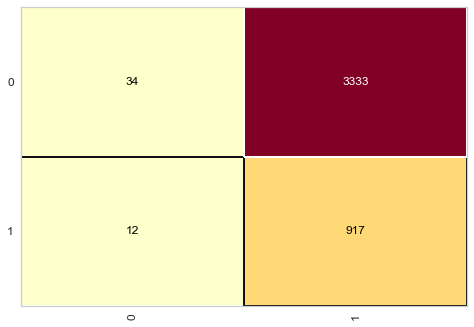

In [49]:
from yellowbrick.classifier import ConfusionMatrix
cm1 = ConfusionMatrix(naive_credit)
cm1.fit(X_credit_train, y_credit_train)
cm1.score(X_credit_test, y_credit_test)

In [50]:
print(classification_report(y_credit_test, naive_prediction))

              precision    recall  f1-score   support

           0       0.74      0.01      0.02      3367
           1       0.22      0.99      0.35       929

    accuracy                           0.22      4296
   macro avg       0.48      0.50      0.19      4296
weighted avg       0.63      0.22      0.09      4296



Decision tree

In [51]:
from sklearn.tree import DecisionTreeClassifier
tree_credit = DecisionTreeClassifier(criterion='entropy')
tree_credit.fit(X_credit_train, y_credit_train)
ds_prediction = tree_credit.predict(X_credit_test)
ds_prediction

array([1, 0, 0, ..., 1, 0, 0], dtype=int64)

In [52]:
accuracy_score(y_credit_test, ds_prediction)
confusion_matrix(y_credit_test, ds_prediction)

array([[3097,  270],
       [ 280,  649]], dtype=int64)

In [53]:
accuracy_score(y_credit_test, ds_prediction)

0.8719739292364991

0.8719739292364991

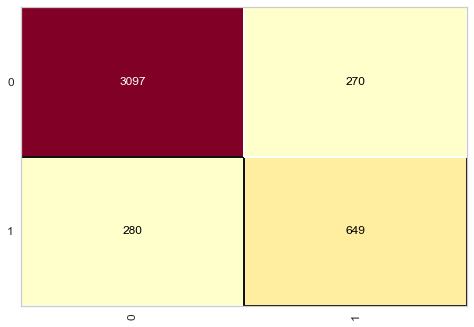

In [54]:
cm2 = ConfusionMatrix(tree_credit)
cm2.fit(X_credit_train, y_credit_train)
cm2.score(X_credit_test, y_credit_test)

In [55]:
print(classification_report(y_credit_test, ds_prediction))

              precision    recall  f1-score   support

           0       0.92      0.92      0.92      3367
           1       0.71      0.70      0.70       929

    accuracy                           0.87      4296
   macro avg       0.81      0.81      0.81      4296
weighted avg       0.87      0.87      0.87      4296



Random Forest

In [56]:
from sklearn.ensemble import RandomForestClassifier
random_forest_credit = RandomForestClassifier(n_estimators=40, criterion='entropy', random_state = 0)
random_forest_credit.fit(X_credit_train, y_credit_train)
rf_prediction = random_forest_credit.predict(X_credit_test)
rf_prediction

array([1, 0, 0, ..., 1, 0, 0], dtype=int64)

In [57]:
accuracy_score(y_credit_test, rf_prediction)
confusion_matrix(y_credit_test, rf_prediction)

array([[3286,   81],
       [ 333,  596]], dtype=int64)

In [58]:
accuracy_score(y_credit_test, rf_prediction)

0.9036312849162011

0.9036312849162011

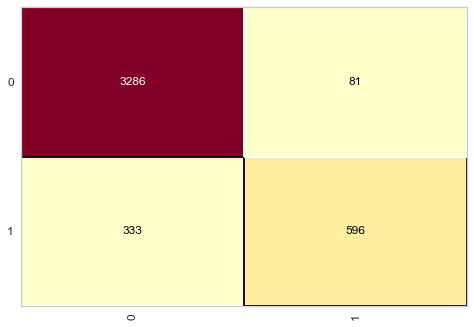

In [59]:
cm3 = ConfusionMatrix(random_forest_credit)
cm3.fit(X_credit_train, y_credit_train)
cm3.score(X_credit_test, y_credit_test)

In [60]:
print(classification_report(y_credit_test, rf_prediction))

              precision    recall  f1-score   support

           0       0.91      0.98      0.94      3367
           1       0.88      0.64      0.74       929

    accuracy                           0.90      4296
   macro avg       0.89      0.81      0.84      4296
weighted avg       0.90      0.90      0.90      4296



XGBoost

In [63]:
!pip install xgboost

In [64]:
from xgboost import XGBClassifier
xgboost = XGBClassifier(n_estimators=1000, max_depth=15, learning_rate=0.05, objective='binary:logistic', random_state=10)
xgboost.fit(X_credit_train, y_credit_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.05, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=15, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=1000,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=10,
              reg_alpha=0, reg_lambda=1, ...)

In [65]:
xgboost.score(X_credit_train, y_credit_train)

0.9999589119894815

In [66]:
xgboost.score(X_credit_test, y_credit_test)

0.9143389199255121

In [67]:
xgb_prediction = xgboost.predict(X_credit_test)
xgb_prediction

array([1, 0, 0, ..., 1, 0, 0])

In [68]:
accuracy_score(y_credit_test, xgb_prediction)
confusion_matrix(y_credit_test, xgb_prediction)

array([[3269,   98],
       [ 270,  659]], dtype=int64)

In [69]:
accuracy_score(y_credit_test, xgb_prediction)

0.9143389199255121

0.9143389199255121

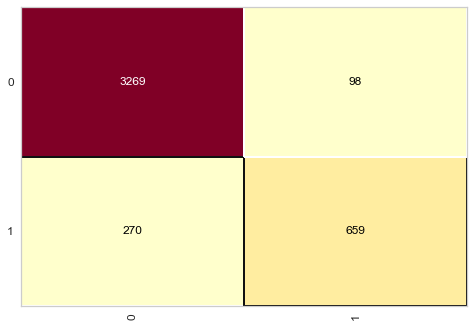

In [70]:
cm4 = ConfusionMatrix(xgboost)
cm4.fit(X_credit_train, y_credit_train)
cm4.score(X_credit_test, y_credit_test)

In [71]:
print(classification_report(y_credit_test, xgb_prediction))

              precision    recall  f1-score   support

           0       0.92      0.97      0.95      3367
           1       0.87      0.71      0.78       929

    accuracy                           0.91      4296
   macro avg       0.90      0.84      0.86      4296
weighted avg       0.91      0.91      0.91      4296



CATBoost

In [72]:
!pip install catboost

In [73]:
!pip install ipywidgets

In [3]:
from catboost import CatBoostClassifier

In [4]:
df_cat = pd.read_csv('credit_risk_dataset (1).csv')

In [5]:
df_cat

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


In [6]:
y_cat = df_cat.iloc[:, 8]
x_cat =  df_cat.drop(columns=['loan_status'])

In [7]:
x_train, x_test, y_train, y_test = train_test_split(x_cat, y_cat, test_size = 0.3, random_state = 0)

In [8]:
categorics = ['person_home_ownership', 'loan_intent', 'loan_grade', 'cb_person_default_on_file']

In [82]:
catboost1 = CatBoostClassifier(task_type='GPU', iterations=100,learning_rate=0.2, depth = 5, random_state = 5, 
                              eval_metric="Accuracy")
catboost1.fit( x_train, y_train, cat_features= categorics, plot=True, eval_set=(x_test, y_test))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8535912	test: 0.8520716	best: 0.8520716 (0)	total: 51.4ms	remaining: 5.09s
1:	learn: 0.8572306	test: 0.8640409	best: 0.8640409 (1)	total: 77.2ms	remaining: 3.78s
2:	learn: 0.8582829	test: 0.8637340	best: 0.8640409 (1)	total: 100ms	remaining: 3.24s
3:	learn: 0.8594668	test: 0.8653708	best: 0.8653708 (3)	total: 116ms	remaining: 2.79s
4:	learn: 0.8756468	test: 0.8796931	best: 0.8796931 (4)	total: 132ms	remaining: 2.51s
5:	learn: 0.8895466	test: 0.8969821	best: 0.8969821 (5)	total: 149ms	remaining: 2.34s
6:	learn: 0.8902920	test: 0.8970844	best: 0.8970844 (6)	total: 170ms	remaining: 2.25s
7:	learn: 0.8905113	test: 0.8969821	best: 0.8970844 (6)	total: 187ms	remaining: 2.15s
8:	learn: 0.8921336	test: 0.8991304	best: 0.8991304 (8)	total: 207ms	remaining: 2.09s
9:	learn: 0.8939314	test: 0.9003581	best: 0.9003581 (9)	total: 223ms	remaining: 2.01s
10:	learn: 0.9050688	test: 0.9105882	best: 0.9105882 (10)	total: 239ms	remaining: 1.94s
11:	learn: 0.9123915	test: 0.9158056	best: 0.91580

In [84]:
catboost2 = CatBoostClassifier(task_type='GPU', iterations=200,learning_rate=0.1, depth = 5, random_state = 5, 
                              eval_metric="Accuracy")
catboost2.fit( x_train, y_train, cat_features= categorics, plot=True, eval_set=(x_test, y_test))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8834079	test: 0.8864450	best: 0.8864450 (0)	total: 55.1ms	remaining: 11s
1:	learn: 0.8880996	test: 0.8929923	best: 0.8929923 (1)	total: 97ms	remaining: 9.6s
2:	learn: 0.8873981	test: 0.8904348	best: 0.8929923 (1)	total: 137ms	remaining: 9.01s
3:	learn: 0.8896343	test: 0.8948338	best: 0.8948338 (3)	total: 186ms	remaining: 9.14s
4:	learn: 0.8960800	test: 0.9006650	best: 0.9006650 (4)	total: 229ms	remaining: 8.93s
5:	learn: 0.9049811	test: 0.9092583	best: 0.9092583 (5)	total: 274ms	remaining: 8.87s
6:	learn: 0.9151978	test: 0.9171355	best: 0.9171355 (6)	total: 331ms	remaining: 9.12s
7:	learn: 0.9161186	test: 0.9189770	best: 0.9189770 (7)	total: 369ms	remaining: 8.86s
8:	learn: 0.9169517	test: 0.9184655	best: 0.9189770 (7)	total: 415ms	remaining: 8.82s
9:	learn: 0.9171271	test: 0.9195908	best: 0.9195908 (9)	total: 473ms	remaining: 8.98s
10:	learn: 0.9177848	test: 0.9200000	best: 0.9200000 (10)	total: 522ms	remaining: 8.96s
11:	learn: 0.9175217	test: 0.9200000	best: 0.9200000 (1

In [85]:
catboost3 = CatBoostClassifier(task_type='GPU', iterations=500,learning_rate=0.05, depth = 5, random_state = 5, 
                              eval_metric="Accuracy")
catboost3.fit( x_train, y_train, cat_features= categorics, plot=True, eval_set=(x_test, y_test))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8834079	test: 0.8864450	best: 0.8864450 (0)	total: 76.4ms	remaining: 38.1s
1:	learn: 0.8875734	test: 0.8920716	best: 0.8920716 (1)	total: 173ms	remaining: 43s
2:	learn: 0.8838902	test: 0.8865473	best: 0.8920716 (1)	total: 251ms	remaining: 41.7s
3:	learn: 0.8866088	test: 0.8912532	best: 0.8920716 (1)	total: 329ms	remaining: 40.8s
4:	learn: 0.8864334	test: 0.8910486	best: 0.8920716 (1)	total: 407ms	remaining: 40.3s
5:	learn: 0.8839779	test: 0.8867519	best: 0.8920716 (1)	total: 489ms	remaining: 40.2s
6:	learn: 0.8866965	test: 0.8901279	best: 0.8920716 (1)	total: 569ms	remaining: 40s
7:	learn: 0.8898097	test: 0.8948338	best: 0.8948338 (7)	total: 646ms	remaining: 39.7s
8:	learn: 0.8890643	test: 0.8949361	best: 0.8949361 (8)	total: 724ms	remaining: 39.5s
9:	learn: 0.8901166	test: 0.8953453	best: 0.8953453 (9)	total: 810ms	remaining: 39.7s
10:	learn: 0.8970446	test: 0.9011765	best: 0.9011765 (10)	total: 887ms	remaining: 39.4s
11:	learn: 0.8975270	test: 0.9015857	best: 0.9015857 (1

In [86]:
catboost4 = CatBoostClassifier(task_type='GPU', iterations=1000,learning_rate=0.01, depth = 5, random_state = 5, 
                              eval_metric="Accuracy")
catboost4.fit( x_train, y_train, cat_features= categorics, plot=True, eval_set=(x_test, y_test))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8834079	test: 0.8864450	best: 0.8864450 (0)	total: 80.3ms	remaining: 1m 20s
1:	learn: 0.8859511	test: 0.8886957	best: 0.8886957 (1)	total: 158ms	remaining: 1m 18s
2:	learn: 0.8838902	test: 0.8865473	best: 0.8886957 (1)	total: 233ms	remaining: 1m 17s
3:	learn: 0.8818293	test: 0.8823529	best: 0.8886957 (1)	total: 306ms	remaining: 1m 16s
4:	learn: 0.8839341	test: 0.8865473	best: 0.8886957 (1)	total: 383ms	remaining: 1m 16s
5:	learn: 0.8818732	test: 0.8822506	best: 0.8886957 (1)	total: 462ms	remaining: 1m 16s
6:	learn: 0.8841533	test: 0.8866496	best: 0.8886957 (1)	total: 542ms	remaining: 1m 16s
7:	learn: 0.8834079	test: 0.8857289	best: 0.8886957 (1)	total: 629ms	remaining: 1m 17s
8:	learn: 0.8818732	test: 0.8823529	best: 0.8886957 (1)	total: 716ms	remaining: 1m 18s
9:	learn: 0.8818732	test: 0.8823529	best: 0.8886957 (1)	total: 799ms	remaining: 1m 19s
10:	learn: 0.8819609	test: 0.8824552	best: 0.8886957 (1)	total: 888ms	remaining: 1m 19s
11:	learn: 0.8836710	test: 0.8858312	best

In [89]:
catboost5 = CatBoostClassifier(task_type='GPU', iterations=100,learning_rate=0.2, depth = 10, random_state = 5, 
                              eval_metric="Accuracy")
catboost5.fit( x_train, y_train, cat_features= categorics, plot=True, eval_set=(x_test, y_test))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8609576	test: 0.8611765	best: 0.8611765 (0)	total: 49ms	remaining: 4.85s
1:	learn: 0.8625362	test: 0.8638363	best: 0.8638363 (1)	total: 87.3ms	remaining: 4.28s
2:	learn: 0.8633693	test: 0.8654731	best: 0.8654731 (2)	total: 121ms	remaining: 3.91s
3:	learn: 0.8636324	test: 0.8649616	best: 0.8654731 (2)	total: 154ms	remaining: 3.7s
4:	learn: 0.8781900	test: 0.8819437	best: 0.8819437 (4)	total: 187ms	remaining: 3.56s
5:	learn: 0.8910374	test: 0.8955499	best: 0.8955499 (5)	total: 229ms	remaining: 3.59s
6:	learn: 0.8943261	test: 0.8986189	best: 0.8986189 (6)	total: 264ms	remaining: 3.5s
7:	learn: 0.8945891	test: 0.8994373	best: 0.8994373 (7)	total: 295ms	remaining: 3.39s
8:	learn: 0.8958607	test: 0.8997442	best: 0.8997442 (8)	total: 325ms	remaining: 3.29s
9:	learn: 0.8989740	test: 0.9015857	best: 0.9015857 (9)	total: 362ms	remaining: 3.25s
10:	learn: 0.9009910	test: 0.9026087	best: 0.9026087 (10)	total: 394ms	remaining: 3.19s
11:	learn: 0.9091467	test: 0.9093606	best: 0.9093606 (

In [92]:
catboost6 = CatBoostClassifier(task_type='GPU', iterations=200,learning_rate=0.1, depth = 10, random_state = 5, 
                              eval_metric="Accuracy")
catboost6.fit( x_train, y_train, cat_features= categorics, plot=True, eval_set=(x_test, y_test))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.9219065	test: 0.9183632	best: 0.9183632 (0)	total: 122ms	remaining: 24.2s
1:	learn: 0.9277383	test: 0.9267519	best: 0.9267519 (1)	total: 242ms	remaining: 24s
2:	learn: 0.9282645	test: 0.9280818	best: 0.9280818 (2)	total: 352ms	remaining: 23.1s
3:	learn: 0.9309831	test: 0.9302302	best: 0.9302302 (3)	total: 485ms	remaining: 23.8s
4:	learn: 0.9306761	test: 0.9303325	best: 0.9303325 (4)	total: 598ms	remaining: 23.3s
5:	learn: 0.9298869	test: 0.9298210	best: 0.9303325 (4)	total: 703ms	remaining: 22.7s
6:	learn: 0.9280014	test: 0.9279795	best: 0.9303325 (4)	total: 815ms	remaining: 22.5s
7:	learn: 0.9307638	test: 0.9302302	best: 0.9303325 (4)	total: 932ms	remaining: 22.4s
8:	learn: 0.9314216	test: 0.9310486	best: 0.9310486 (8)	total: 1.04s	remaining: 22.1s
9:	learn: 0.9316846	test: 0.9313555	best: 0.9313555 (9)	total: 1.16s	remaining: 22s
10:	learn: 0.9324739	test: 0.9324808	best: 0.9324808 (10)	total: 1.26s	remaining: 21.7s
11:	learn: 0.9325178	test: 0.9327877	best: 0.9327877 (11

In [95]:
catboost7 = CatBoostClassifier(task_type='GPU', iterations=500,learning_rate=0.05, depth = 10, random_state = 5, 
                              eval_metric="Accuracy")
catboost7.fit( x_train, y_train, cat_features= categorics, plot=True, eval_set=(x_test, y_test))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.9208980	test: 0.9204092	best: 0.9204092 (0)	total: 219ms	remaining: 1m 49s
1:	learn: 0.9210296	test: 0.9208184	best: 0.9208184 (1)	total: 404ms	remaining: 1m 40s
2:	learn: 0.9230466	test: 0.9239898	best: 0.9239898 (2)	total: 765ms	remaining: 2m 6s
3:	learn: 0.9235727	test: 0.9227621	best: 0.9239898 (2)	total: 1.13s	remaining: 2m 20s
4:	learn: 0.9223888	test: 0.9221483	best: 0.9239898 (2)	total: 1.42s	remaining: 2m 20s
5:	learn: 0.9220381	test: 0.9218414	best: 0.9239898 (2)	total: 1.76s	remaining: 2m 25s
6:	learn: 0.9221696	test: 0.9226598	best: 0.9239898 (2)	total: 2.13s	remaining: 2m 30s
7:	learn: 0.9223450	test: 0.9222506	best: 0.9239898 (2)	total: 2.5s	remaining: 2m 33s
8:	learn: 0.9234850	test: 0.9234783	best: 0.9239898 (2)	total: 2.85s	remaining: 2m 35s
9:	learn: 0.9263790	test: 0.9272634	best: 0.9272634 (9)	total: 3.22s	remaining: 2m 37s
10:	learn: 0.9310708	test: 0.9308440	best: 0.9308440 (10)	total: 3.56s	remaining: 2m 38s
11:	learn: 0.9312023	test: 0.9313555	best: 

In [96]:
catboost8 = CatBoostClassifier(task_type='GPU', iterations=1000,learning_rate=0.01, depth = 10, random_state = 5, 
                              eval_metric="Accuracy")
catboost8.fit( x_train, y_train, cat_features= categorics, plot=True, eval_set=(x_test, y_test))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.9208980	test: 0.9204092	best: 0.9204092 (0)	total: 209ms	remaining: 3m 29s
1:	learn: 0.9210296	test: 0.9208184	best: 0.9208184 (1)	total: 420ms	remaining: 3m 29s
2:	learn: 0.9213365	test: 0.9208184	best: 0.9208184 (1)	total: 771ms	remaining: 4m 16s
3:	learn: 0.9212926	test: 0.9207161	best: 0.9208184 (1)	total: 960ms	remaining: 3m 58s
4:	learn: 0.9214680	test: 0.9208184	best: 0.9208184 (1)	total: 1.31s	remaining: 4m 21s
5:	learn: 0.9215996	test: 0.9208184	best: 0.9208184 (1)	total: 1.67s	remaining: 4m 36s
6:	learn: 0.9212926	test: 0.9208184	best: 0.9208184 (1)	total: 1.95s	remaining: 4m 36s
7:	learn: 0.9212049	test: 0.9208184	best: 0.9208184 (1)	total: 2.13s	remaining: 4m 24s
8:	learn: 0.9214242	test: 0.9208184	best: 0.9208184 (1)	total: 2.5s	remaining: 4m 35s
9:	learn: 0.9213803	test: 0.9208184	best: 0.9208184 (1)	total: 2.77s	remaining: 4m 34s
10:	learn: 0.9212926	test: 0.9208184	best: 0.9208184 (1)	total: 3.04s	remaining: 4m 32s
11:	learn: 0.9212926	test: 0.9208184	best: 

In [13]:
catboost9 = CatBoostClassifier(task_type='GPU', iterations=100,learning_rate=0.2, depth = 16, random_state = 5, 
                              eval_metric="Accuracy")
catboost9.fit( x_train, y_train, cat_features= categorics, plot=True, eval_set=(x_test, y_test))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8708235	test: 0.8526854	best: 0.8526854 (0)	total: 421ms	remaining: 41.7s
1:	learn: 0.8750329	test: 0.8565729	best: 0.8565729 (1)	total: 839ms	remaining: 41.1s
2:	learn: 0.8779707	test: 0.8570844	best: 0.8570844 (2)	total: 1.25s	remaining: 40.3s
3:	learn: 0.8778392	test: 0.8596419	best: 0.8596419 (3)	total: 1.67s	remaining: 40s
4:	learn: 0.8791108	test: 0.8602558	best: 0.8602558 (4)	total: 2.08s	remaining: 39.5s
5:	learn: 0.8877050	test: 0.8691560	best: 0.8691560 (5)	total: 2.49s	remaining: 39s
6:	learn: 0.8984478	test: 0.8781586	best: 0.8781586 (6)	total: 2.91s	remaining: 38.6s
7:	learn: 0.9053758	test: 0.8839898	best: 0.8839898 (7)	total: 3.32s	remaining: 38.1s
8:	learn: 0.9091467	test: 0.8884910	best: 0.8884910 (8)	total: 3.75s	remaining: 37.9s
9:	learn: 0.9110760	test: 0.8899233	best: 0.8899233 (9)	total: 4.17s	remaining: 37.5s
10:	learn: 0.9135315	test: 0.8906394	best: 0.8906394 (10)	total: 4.59s	remaining: 37.2s
11:	learn: 0.9143208	test: 0.8913555	best: 0.8913555 (11

In [14]:
catboost10 = CatBoostClassifier(task_type='GPU', iterations=200,learning_rate=0.1, depth = 16, random_state = 5, 
                              eval_metric="Accuracy")
catboost10.fit( x_train, y_train, cat_features= categorics, plot=True, eval_set=(x_test, y_test))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.9407612	test: 0.9190793	best: 0.9190793 (0)	total: 2.4s	remaining: 7m 57s
1:	learn: 0.9412435	test: 0.9291049	best: 0.9291049 (1)	total: 4.76s	remaining: 7m 51s
2:	learn: 0.9429975	test: 0.9294118	best: 0.9294118 (2)	total: 7.2s	remaining: 7m 52s
3:	learn: 0.9442691	test: 0.9287980	best: 0.9294118 (2)	total: 9.56s	remaining: 7m 48s
4:	learn: 0.9443129	test: 0.9295141	best: 0.9295141 (4)	total: 12s	remaining: 7m 48s
5:	learn: 0.9447514	test: 0.9306394	best: 0.9306394 (5)	total: 14.4s	remaining: 7m 47s
6:	learn: 0.9447075	test: 0.9322762	best: 0.9322762 (6)	total: 16.8s	remaining: 7m 44s
7:	learn: 0.9446198	test: 0.9329923	best: 0.9329923 (7)	total: 19.2s	remaining: 7m 41s
8:	learn: 0.9449268	test: 0.9330946	best: 0.9330946 (8)	total: 21.6s	remaining: 7m 39s
9:	learn: 0.9459353	test: 0.9335038	best: 0.9335038 (9)	total: 24s	remaining: 7m 36s
10:	learn: 0.9460668	test: 0.9338107	best: 0.9338107 (10)	total: 26.4s	remaining: 7m 34s
11:	learn: 0.9467684	test: 0.9335038	best: 0.93

In [ ]:
catboost11 = CatBoostClassifier(task_type='GPU', iterations=300,learning_rate=0.05, depth = 16, random_state = 5, 
                              eval_metric="Accuracy")
catboost11.fit( x_train, y_train, cat_features= categorics, plot=True, eval_set=(x_test, y_test))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.9407612	test: 0.9190793	best: 0.9190793 (0)	total: 1.81s	remaining: 9m
1:	learn: 0.9411558	test: 0.9292072	best: 0.9292072 (1)	total: 3.61s	remaining: 8m 57s
2:	learn: 0.9420766	test: 0.9297187	best: 0.9297187 (2)	total: 5.41s	remaining: 8m 55s
3:	learn: 0.9418136	test: 0.9318670	best: 0.9318670 (3)	total: 7.2s	remaining: 8m 53s
4:	learn: 0.9428221	test: 0.9319693	best: 0.9319693 (4)	total: 9.01s	remaining: 8m 51s
5:	learn: 0.9426905	test: 0.9322762	best: 0.9322762 (5)	total: 10.8s	remaining: 8m 49s
6:	learn: 0.9433921	test: 0.9323785	best: 0.9323785 (6)	total: 12.6s	remaining: 8m 47s
7:	learn: 0.9432605	test: 0.9328900	best: 0.9328900 (7)	total: 14.4s	remaining: 8m 45s
8:	learn: 0.9432605	test: 0.9321739	best: 0.9328900 (7)	total: 16.2s	remaining: 8m 43s
9:	learn: 0.9436990	test: 0.9330946	best: 0.9330946 (9)	total: 18s	remaining: 8m 41s
10:	learn: 0.9441375	test: 0.9330946	best: 0.9330946 (9)	total: 19.8s	remaining: 8m 40s
11:	learn: 0.9447075	test: 0.9328900	best: 0.9330

In [ ]:
catboost12 = CatBoostClassifier(task_type='GPU', iterations=1000,learning_rate=0.01, depth = 16, random_state = 5, 
                              eval_metric="Accuracy")
catboost12.fit( x_train, y_train, cat_features= categorics, plot=True, eval_set=(x_test, y_test))

In [ ]:
cat_prediction = catboost.predict(x_test)
cat_prediction

In [ ]:
print("Accuracy: %.2f%%" % (accuracy_score(y_test, cat_prediction) * 100.0))

In [ ]:
confusion_matrix(y_test, cat_prediction)

In [ ]:
confusion_matrix(y_test, cat_prediction)

In [ ]:
print(classification_report(y_test, cat_prediction))

SVM

In [ ]:
from sklearn.svm import SVC
svm_credit = SVC(kernel='rbf', random_state=1, C = 2.0)
svm_credit.fit(X_credit_train, y_credit_train)
svm_prediction = svm_credit.predict(X_credit_test)
svm_prediction

In [ ]:
accuracy_score(y_credit_test, svm_prediction)

In [ ]:
cm5 = ConfusionMatrix(svm_credit)
cm5.fit(X_credit_train, y_credit_train)
cm5.score(X_credit_test, y_credit_test)

In [ ]:
print(classification_report(y_credit_test, svm_prediction))

KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_credit = KNeighborsClassifier(n_neighbors=5, metric='minkowski', p = 2)
knn_credit.fit(X_credit_train, y_credit_train)
knn_prediction = knn_credit.predict(X_credit_test)
knn_prediction

In [ ]:
accuracy_score(y_credit_test, knn_prediction) 

In [ ]:
cm6 = ConfusionMatrix(knn_credit)
cm6.fit(X_credit_train, y_credit_train)
cm6.score(X_credit_test, y_credit_test)

In [ ]:
print(classification_report(y_credit_test, knn_prediction))

Artificial Neural Network

In [ ]:
from sklearn.neural_network import MLPClassifier
rede_neural_credit = MLPClassifier(max_iter=1500, verbose=True, tol=0.0000100,
                                   solver = 'adam', activation = 'relu',
                                   hidden_layer_sizes = (20,20))
rede_neural_credit.fit(X_credit_train, y_credit_train)
neural_prediction = rede_neural_credit.predict(X_credit_test)
neural_prediction

In [ ]:
accuracy_score(y_credit_test, neural_prediction)

In [ ]:
cm7 = ConfusionMatrix(rede_neural_credit)
cm7.fit(X_credit_train, y_credit_train)
cm7.score(X_credit_test, y_credit_test)

In [ ]:
print(classification_report(y_credit_test, neural_prediction))